In this notebook, we load the features which we extracted and stored in previous notebook. Then we apply various clssifying models and perform validation and check their performance using various metrics.

# Loading the features dataset

In [2]:
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set();

In [3]:
#Read all Files into 'data' variable

def ReadFeaturesFile(csv_dir):
    data=None
    for csv in glob.glob(csv_dir+'*_features.csv'):
        df=pd.read_csv(csv)
        df['genre']=os.path.basename(csv).split('_')[0]
        if data is None:
            data=df
        else:
            data=data.append(df,ignore_index=True)
    return data

# Reading the dataset having 20 MFCC + 6 other parameters
data=ReadFeaturesFile('mfcc_20/')

In [4]:
params=list(data[0:0].columns[1:])

In [5]:
# Mapping gnere names with unique numbers

genre_mapper={k[1]:k[0] for k in zip(range(len(data['genre'].unique())),sorted(data['genre'].unique())) }
data_mapped=data.copy();
data_mapped['genre']=data_mapped['genre'].map(genre_mapper)
data_mapped

,file,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,mfcc_20,bandwidth,rolloff,zero_cross,chroma,centroid,rms,genre
0,genres/blues/blues.00000.wav,-113.570648,121.571793,-19.168142,42.366421,-6.364664,18.623499,-13.704891,15.343150,-12.274110,10.976572,-8.326573,8.803793,-3.672300,5.747995,-5.162882,0.752740,-1.690215,-0.408979,-2.303523,1.221290,2002.449060,3805.839606,0.083045,0.350088,1784.165850,0.130228,0
1,genres/blues/blues.00001.wav,-207.501694,123.991264,8.955127,35.877651,2.907320,21.510466,-8.560436,23.370686,-10.099661,11.900497,-5.555639,5.376328,-2.231760,4.220140,-6.012148,0.927997,-0.731125,0.295073,-0.283518,0.531216,2039.036516,3550.522098,0.056040,0.340914,1530.176679,0.095948,0
2,genres/blues/blues.00002.wav,-90.722595,140.446304,-29.093889,31.684334,-13.984504,25.764742,-13.664875,11.639934,-11.783642,9.718760,-13.133803,5.791199,-8.907628,-1.077000,-9.229274,2.451689,-7.729093,-1.816407,-3.439720,-2.231259,1747.702312,3042.260232,0.076291,0.363637,1552.811865,0.175570,0
3,genres/blues/blues.00003.wav,-199.544205,150.090912,5.662678,26.859079,1.771399,14.234031,-4.832006,9.286495,-0.759187,8.137607,-3.200653,6.079319,-2.480174,-1.079305,-2.870789,0.780873,-3.319597,0.636965,-0.619121,-3.407449,1596.412872,2184.745799,0.033309,0.404785,1070.106615,0.141093,0
4,genres/blues/blues.00004.wav,-160.337708,126.219635,-35.587811,22.148071,-32.478603,10.852294,-23.352331,0.498433,-11.793437,1.207255,-13.088418,-2.813867,-6.933385,-7.552725,-9.164666,-4.520576,-5.454034,-0.916874,-4.404826,-11.703234,1748.172116,3579.757627,0.101461,0.308526,1835.004266,0.091529,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,genres/rock/rock.00095.wav,-153.640961,109.864647,-23.065697,59.050137,-7.475873,19.726795,-16.484838,18.066439,-22.202003,15.409105,-12.372051,12.348828,-12.297895,5.777902,-10.273881,1.789867,-13.289984,2.484145,-6.713265,-1.193787,2106.541053,4253.557033,0.089227,0.352063,2008.149458,0.079486,9
996,genres/rock/rock.00096.wav,-142.392029,116.189629,-32.147167,49.117847,-8.373376,22.882061,-18.315985,20.098146,-22.093319,10.798820,-12.979385,14.080058,-16.392994,4.154396,-4.364872,3.739020,-10.848309,1.881228,-7.461491,-2.795339,2068.942009,4149.338328,0.097664,0.398687,2006.843354,0.076458,9
997,genres/rock/rock.00097.wav,-124.952271,115.177155,-47.975151,52.814674,-13.484810,21.742352,-12.407492,20.122042,-18.363756,10.120382,-16.037611,10.474113,-17.947060,1.212127,-11.519417,1.838089,-12.845291,3.440978,-12.588070,-2.106337,1927.293153,4031.405321,0.121823,0.432142,2077.526598,0.081651,9
998,genres/rock/rock.00098.wav,-225.007751,123.646751,-9.724174,56.605164,10.436499,20.622280,-10.253696,15.561657,-8.227290,12.800150,-9.001975,7.682843,-10.070732,-0.256386,-5.275369,-2.812177,-4.416050,1.556207,-5.041897,-3.590644,1818.450280,3015.631004,0.048724,0.362485,1398.699344,0.083860,9


## Some plotting and exploration of the features to see any cross correlation

We make scatter plots, color coded by genres. For simplicity, we split the plots into two set of parameters - MFCCs and non-MFCCs

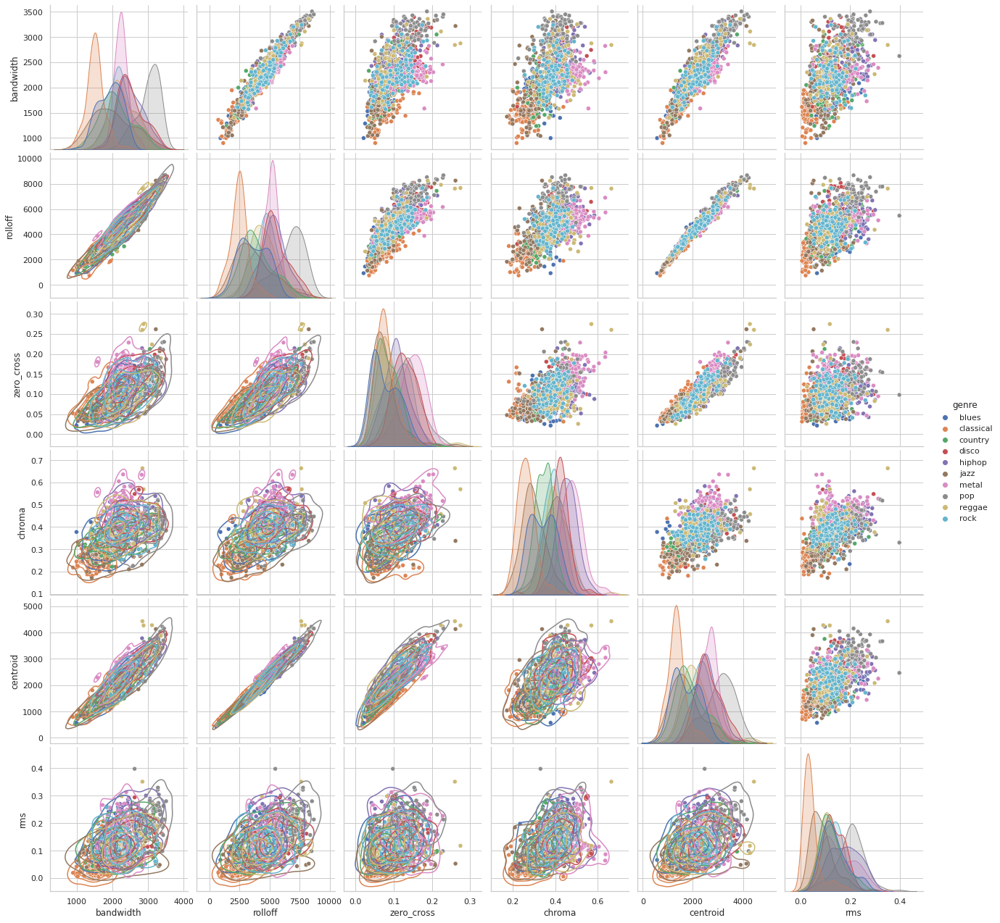

In [8]:
# Scatter plot among non-MFCC parameters

sns.set_style("whitegrid");
g=sns.pairplot(data[params[-7:]], hue="genre", height=3);
g.map_lower(sns.kdeplot, levels=4, color=".2")
plt.show()

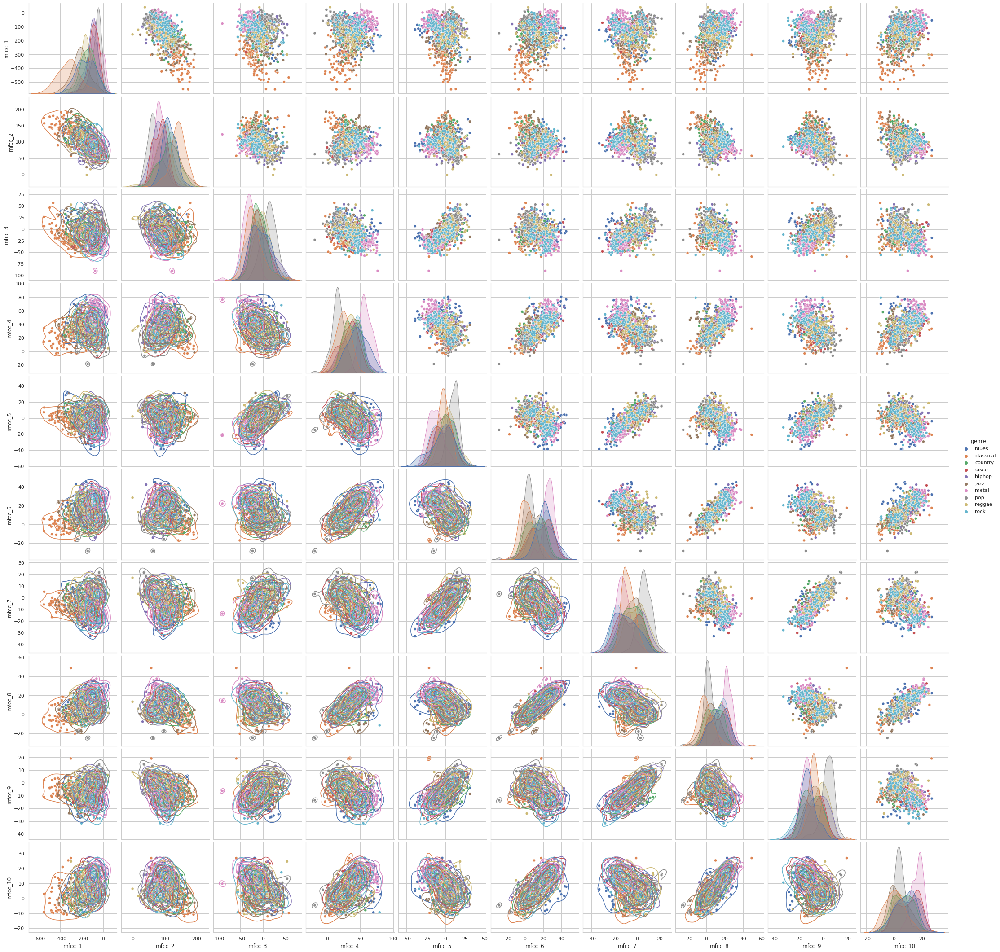

In [9]:
# Scatter plot among first 10 MFCC parameters

sns.set_style("whitegrid");
g=sns.pairplot(data[params[list(range(10))+[-1]]], hue="genre", height=3);
g.map_lower(sns.kdeplot, levels=4, color=".2")
plt.show()

Now the scatter plot on full set of features and on full dataset 

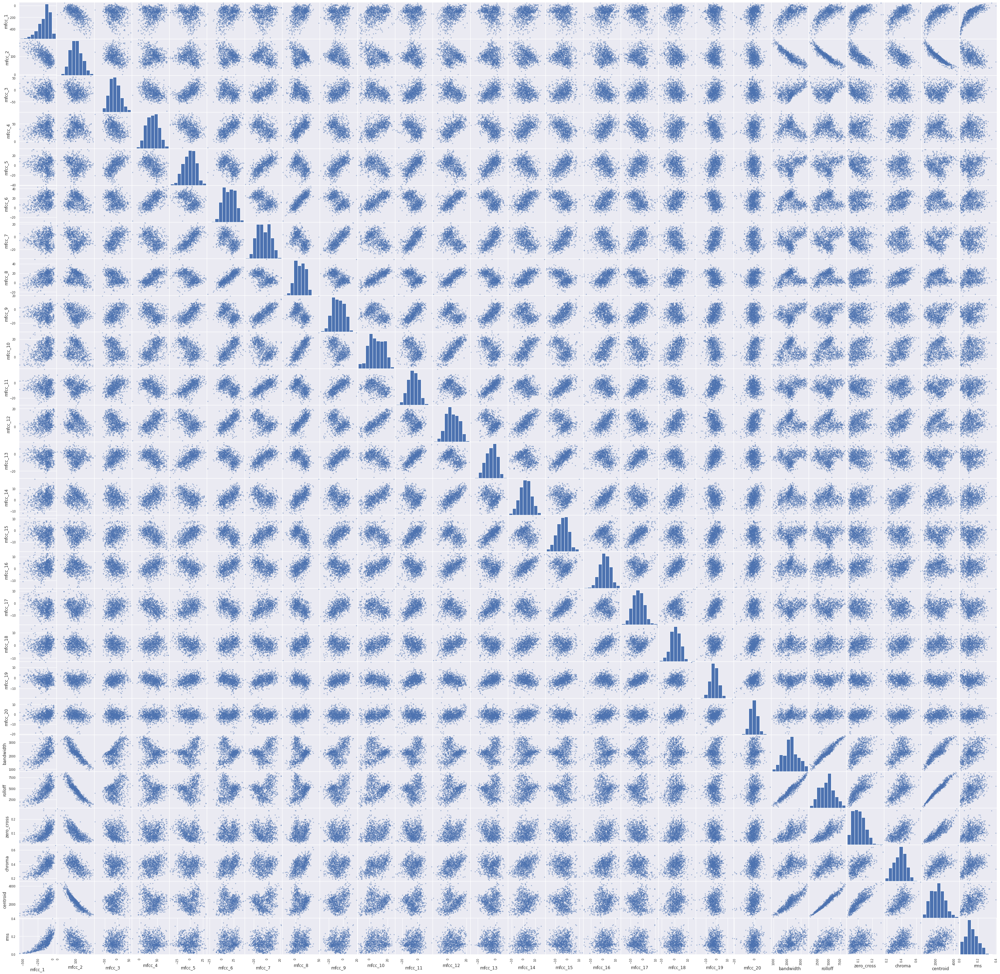

In [26]:
from pandas.plotting import scatter_matrix
scatter_matrix(data[params[:-1]], figsize=(50,50));

We make a heat map of cross-correlation values to look for highly corelated prameters and whether by dropiing those we can obtain better model accuracies.

In [27]:
feat_corr=data[params[:-1]].corr().abs()

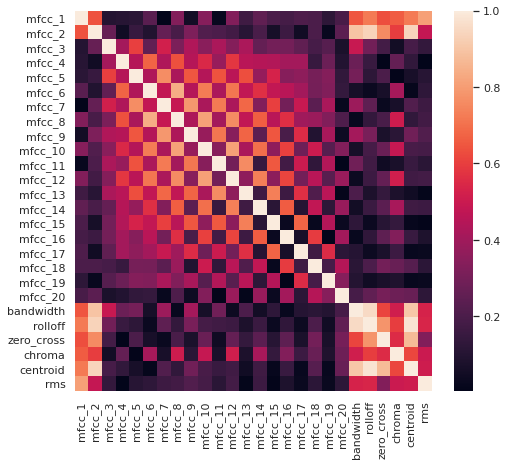

In [31]:
plt.figure(figsize=(8,7))
sns.heatmap(feat_corr,xticklabels=1,yticklabels=1);

Next we only hilight correlation values above a threshold (we chose 0.9)

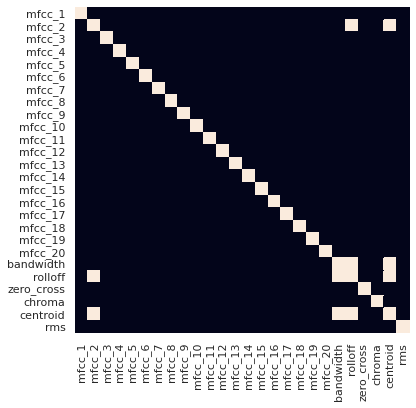

In [29]:
drop_thrsh=0.9
plt.figure(figsize=(6,6))
sns.heatmap(feat_corr>drop_thrsh,cbar=False,xticklabels=1,yticklabels=1);

Next we iteratively drop one feature at a time which has the most numbers of high correlations. We replot the correlation map at each iteration.

Dropped features  ['rolloff']


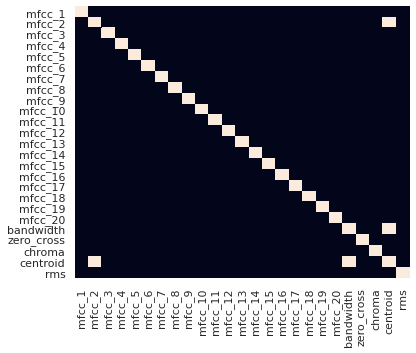

Dropped features  ['rolloff', 'centroid']


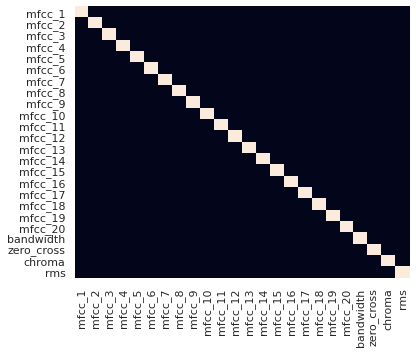

In [32]:
high_corr=feat_corr>drop_thrsh
drop_indices=[]
while high_corr.sum().max()>1:
    drop_indices.append( high_corr.columns[high_corr.sum().argmax()] )
    print("Dropped features ",drop_indices)
    high_corr=high_corr.drop(index=drop_indices[-1], columns=drop_indices[-1])
    plt.figure(figsize=(6,5)); sns.heatmap(high_corr,cbar=False,xticklabels=1,yticklabels=1); plt.show()

In [36]:
# We can drop these features from our working set of features

#[params.remove(ind) for ind in drop_indices]; # this is commented out becuase we are finally not dropping any of the features.

After obtaining the list of feature which can be droppen to get rid to all high correlations, we re-run our models (to be executed are below) and check whether there is any imporvement in model performaces by dropping these features. However, we found that the performace has decreased consistently for all models after dropping these features. It might be possible - eventhough they are highly correlated in the full dataset, they are capable in better discrimainting some genres. Therefore, we ended up NOT dropping any features and found the 20 (MFCC) + 6 feature set is optimal.

# Build various models and perform validation check

### Function `cross_validate(...)` for cross-validation and plotting various metrics
This funcion takes dataset and Model pipeline as arguments and analyse the validation output. We implement this as a function so that we can cleanly re-run this code for each models we try.

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

def cross_validate(X,y, pipe, label='', silent=False):
    # X - X data array
    # y - y vector
    # pipe - Model pipeline
    # label - label to add in plots
    # silent - to supress prints and plots

    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2,shuffle=True, random_state = 100)
    
    accs=pd.DataFrame(columns=['Overall']+sorted(list(genre_mapper.keys())))
    TrueVsPred=pd.DataFrame(columns=sorted(list(genre_mapper.keys())), index=sorted(list(genre_mapper.keys()))).fillna(0)
    genre_rank={g:[] for g in genre_mapper.keys()}
    
    # Starting cross validating loop here
    
    kfold = StratifiedKFold(5,shuffle=True,random_state = 440)
    for train_index,test_index in kfold.split(X_train,y_train):
        X_train_train,X_train_test = X_train.iloc[train_index],X_train.iloc[test_index]
        y_train_train,y_train_test = y_train.iloc[train_index],y_train.iloc[test_index]

        pipe_clone = clone(pipe)
        
        pipe_clone.fit(X_train_train,y_train_train)

        pred = pipe_clone.predict(X_train_test)

        proba=pipe_clone.predict_proba(X_train_test)
        proba_rank=proba.copy()
        for row in proba_rank:
            row[np.argsort(row)[::-1]]=range(1,len(row)+1)  # Converting probabilities to ranking
        proba_rank[proba<0.05]=len(row)                     # For probability <5%, putting the genre out of ranking
        
        # Storing verious metrics here
        tmp_acc={}
        tmp_acc['Overall']=accuracy_score(y_train_test,pred)
        tmp_TVP=pd.DataFrame().reindex_like(TrueVsPred)
        for k in genre_mapper.keys():
            tmp_index=y_train_test==genre_mapper[k]
            tmp_acc[k]=accuracy_score(y_train_test[tmp_index],pred[tmp_index])
            tmp_counts = np.array([list(pred[tmp_index]).count(genre_mapper[k2]) for k2 in genre_mapper.keys()])
            tmp_TVP.loc[genre_mapper.keys(), k] = tmp_counts/tmp_counts.sum()
            genre_rank[k]=genre_rank[k] + list(proba_rank[tmp_index,genre_mapper[k]].ravel())
        accs=accs.append(tmp_acc,ignore_index=True)         # Stroing accuracy/reall values
        TrueVsPred=TrueVsPred.add(tmp_TVP)                  # Storing values for Pred vs True genre heatmap plot.
    TrueVsPred=TrueVsPred/len(accs)

    pipe_clone = clone(pipe)
    pipe_clone.fit(X_train,y_train)
    test_pred=pipe_clone.predict(X_test)
    test_acc=accuracy_score(y_test,test_pred)

    if not silent:
        print('Cross validation accuracies:')
        print(accs.mean())
        print("Overall accuracy on test set is ",test_acc)

        plt.figure(figsize=(10,4))
        plt.plot(accs.mean(),'o-')                            #Plotting accuracy vs genre
        plt.ylim([0,1])
        plt.ylabel(label+' CV accuracy');

        plt.figure(figsize=(8,5))
        ax = sns.heatmap(TrueVsPred, cbar=True)               # Plotting Pred vs true heatmap
        plt.xlabel('True gneres')
        plt.ylabel(label+' CV Predicted genres');

        fig=plt.figure(figsize=(13,10))
        axs = fig.subplots(int(np.ceil(len(genre_rank)/4)), 4)    # Plotting ranking histogram plot
        axs=axs.ravel()
        fig.suptitle('Histogram of ranks predicting the correct Genre')
        fig.text(0.5, 0.04, 'Predicted Ranking', ha='center')
        fig.text(0.04, 0.5, 'Normalized counts for each rank position', va='center', rotation='vertical')
        i=0
        for g in sorted(genre_rank.keys()):
            n, bins, patches=axs[i].hist(genre_rank[g],bins=range(1,len(genre_rank)+2), density=True)
            patches[-1].set_fc('r')
            patches[0].set_fc('g')
            axs[i].set_title(g)
            axs[i].xaxis.set_ticks(range(1,len(genre_rank)+1))
            axs[i].set_ylim([0,1])
            i=i+1

        plt.show()

    return (accs, test_acc, TrueVsPred, genre_rank)

## K-nearest neighbour classifier

#### Interpreting the outputs from cross validation function (executed below)

1. KNN 5-Fold cross validation accuracies and test dataset accuracy are printed first.
2. CV accuracies are plotted for overall and also for each genre. The accuracies for each genre essentially means recall metric, since we only select positive (TP+FN) values here.
3. Predicted vs True Genres heatmap plot - The diagonal values represnt the CV accuracy (or recall) for each Genre, i.e, the fraction of correct genre identification. The off-diagnal values represnt where the mis-identiifications are predicted to.
4. Ranking histogram - since we are interested in assigning probabilities for multiple genres to a single peice of audio, it is also important to see what is the ranking of a mis-identified point. In this plot, the green bar means all those cases which were correctly identified and the genre is ranked 1 (i.e most probable), the red bar represents the cases which has been misclassified and has been assigned less than 5% probability (a cutoff we set instead of 0) for the correct genre, i.e, the correct genre don't make into any rank. The blue bars in between 2 - 10 represnts the misclassified points, i.e, not ranked at top, but has been assigned some probability for correct genre, hence it will make into the lower ranks positions.

Cross validation accuracies:
Overall      0.613750
blues        0.648529
classical    0.933333
country      0.618333
disco        0.516176
hiphop       0.445000
jazz         0.600000
metal        0.682500
pop          0.733824
reggae       0.543333
rock         0.447059
dtype: float64
Overall accuracy on test set is  0.555


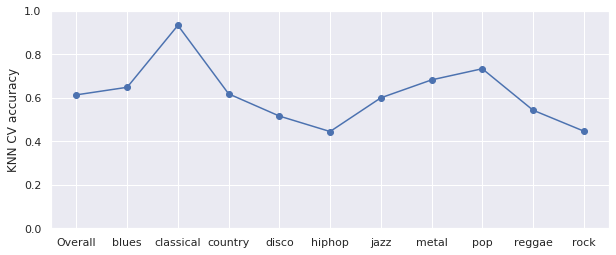

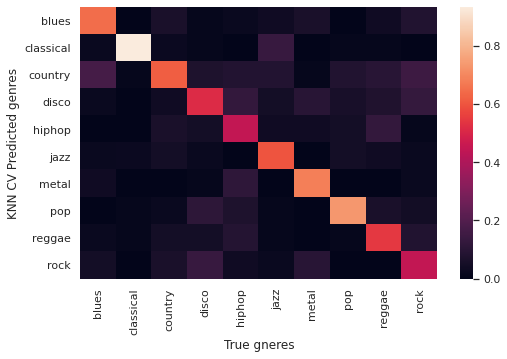

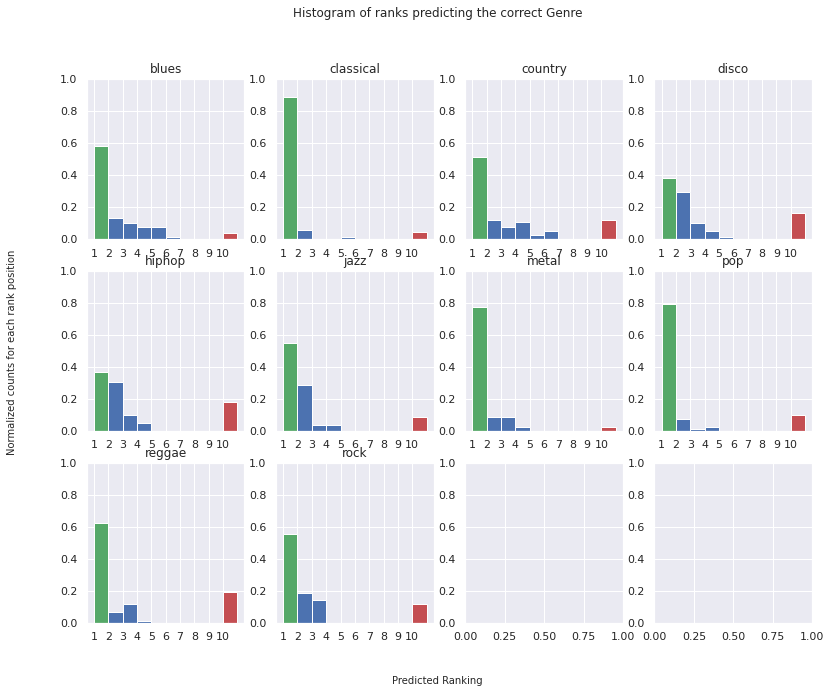

In [11]:
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA


X=data_mapped[params[:-1]]  # Selecting all required paramter columns here
y=data_mapped['genre']      # Selecting Genre column here

# Building a pipeline
pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 20)),
                ('clf',KNeighborsClassifier(n_neighbors=7))])

a,b,c,d=cross_validate(X,y,pipe,'KNN');

In [ ]:
# Saving the model and few other required variables to a file

pipe_clone = clone(pipe)
pipe_clone.fit(X,y)

import pickle
with open('KNN_mfcc20.model','wb') as fh:
    pickle.dump({'model':pipe_clone,
                 'genre_mapper':genre_mapper,
                 'n_mfcc':20,
                 'columns':X.columns},fh)

#### Exploring the mis-classifications further
Here we select and explore in detail one of the low accuracy genre - we chose Rock. We can visualize where each of the audio is predicted into.


In [12]:
num_neighbors= 7
test_genre = 9
X=data_mapped[params[:-1]]
y=data_mapped['genre']
X.head()
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state = 100)
pipe = Pipeline([('scaler',StandardScaler()),
                ('clf',KNeighborsClassifier(n_neighbors=num_neighbors))])

accs=pd.DataFrame(columns=['Overall']+sorted(list(genre_mapper.keys())))
kfold = StratifiedKFold(5,shuffle=True,random_state = 440)
results = []
for train_index,test_index in kfold.split(X_train,y_train):
  X_train_train,X_train_test = X_train.iloc[train_index],X_train.iloc[test_index]
  y_train_train,y_train_test = y_train.iloc[train_index],y_train.iloc[test_index]
  pipe_clone = clone(pipe)
  pipe_clone.fit(X_train_train,y_train_train)
  perd_prob = pipe_clone.predict_proba(X_train_test.loc[y_train_test == test_genre])
  results.append(perd_prob)

[0.2857142857142857, 0.0, 0.14285714285714285, 0.42857142857142855, 0.42857142857142855, 0.14285714285714285, 0.14285714285714285, 0.8571428571428571, 0.2857142857142857, 0.42857142857142855, 0.7142857142857143, 0.7142857142857143, 0.42857142857142855, 0.5714285714285714, 0.5714285714285714, 0.42857142857142855, 0.14285714285714285, 0.5714285714285714, 0.7142857142857143, 0.42857142857142855, 0.2857142857142857, 0.42857142857142855, 0.14285714285714285, 0.2857142857142857, 0.5714285714285714, 0.2857142857142857, 0.42857142857142855, 0.8571428571428571, 0.2857142857142857, 0.14285714285714285, 0.14285714285714285, 0.42857142857142855, 0.8571428571428571, 0.7142857142857143, 0.42857142857142855, 0.7142857142857143, 0.2857142857142857, 0.14285714285714285, 0.7142857142857143, 0.14285714285714285, 0.0, 0.14285714285714285, 0.2857142857142857, 0.14285714285714285, 0.0, 0.2857142857142857, 0.42857142857142855, 0.0, 0.2857142857142857, 0.2857142857142857, 0.14285714285714285, 0.71428571428571

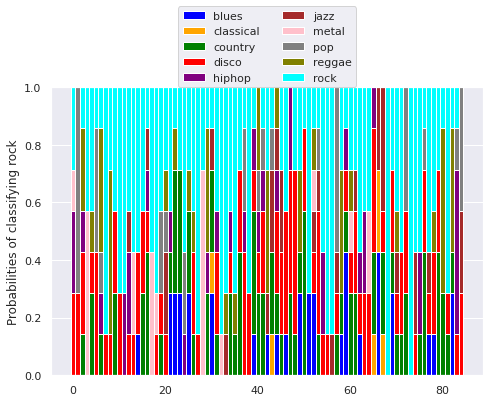

In [13]:
colors = ['blue','orange','green','red','purple','brown','pink','gray','olive','cyan']
num_genres = 10
blues_probs = [S[i][0] for S in results for i in range(len(S))]
classical_probs = [S[i][1] for S in results for i in range(len(S))]
country_probs = [S[i][2] for S in results for i in range(len(S))]
disco_probs = [S[i][3] for S in results for i in range(len(S))]
hiphop_probs = [S[i][4] for S in results for i in range(len(S))]
jazz_probs = [S[i][5] for S in results for i in range(len(S))]
metal_probs = [S[i][6] for S in results for i in range(len(S))]
pop_probs = [S[i][7] for S in results for i in range(len(S))]
reggae_probs = [S[i][8] for S in results for i in range(len(S))]
rock_probs = [S[i][9] for S in results for i in range(len(S))]
print(rock_probs)
all_probs = [blues_probs,classical_probs,country_probs,disco_probs,hiphop_probs,jazz_probs,metal_probs,pop_probs,reggae_probs,rock_probs]
all_probs = [np.array(j) for j in all_probs]
ind = np.arange(sum([len(S) for S in results]))
width = 1.0
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(ind,blues_probs,width,color = colors[0])
ax.bar(ind,classical_probs,width,bottom = sum(all_probs[0:1]),color = colors[1])
ax.bar(ind,country_probs,width,bottom =sum(all_probs[0:2]) ,color = colors[2])
ax.bar(ind,disco_probs,width,bottom=sum(all_probs[0:3]),color = colors[3])
ax.bar(ind,hiphop_probs,width,bottom = sum(all_probs[0:4]),color = colors[4])
ax.bar(ind,jazz_probs,width,bottom = sum(all_probs[0:5]),color = colors[5])
ax.bar(ind,metal_probs,width,bottom = sum(all_probs[0:6]),color = colors[6])
ax.bar(ind,pop_probs,width,bottom = sum(all_probs[0:7]),color = colors[7])
ax.bar(ind,reggae_probs,width,bottom = sum(all_probs[0:8]),color = colors[8])
ax.bar(ind,rock_probs,width,bottom = sum(all_probs[0:9]),color = colors[9])
ax.set_ylabel('Probabilities of classifying ' + sorted(list(genre_mapper.keys()))[test_genre])
ax.legend(loc="upper center", bbox_to_anchor=(0.5, 1.3), ncol=2,labels = sorted(list(genre_mapper.keys())))
plt.show()

## Now we will repreat the same process but for various other models

## Support vector machine

Cross validation accuracies:
Overall      0.680000
blues        0.734559
classical    0.932381
country      0.579167
disco        0.542647
hiphop       0.583333
jazz         0.712500
metal        0.821667
pop          0.793382
reggae       0.619167
rock         0.505882
dtype: float64
Overall accuracy on test set is  0.595


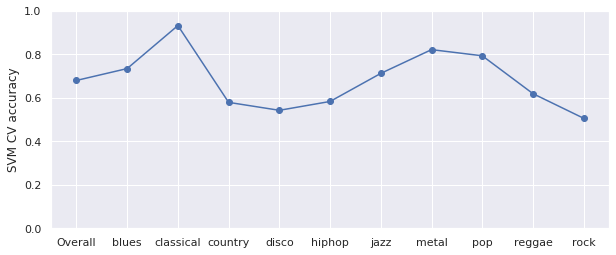

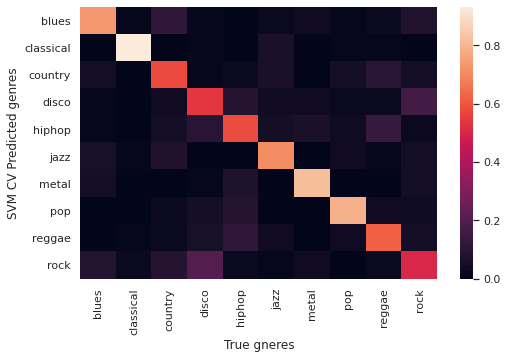

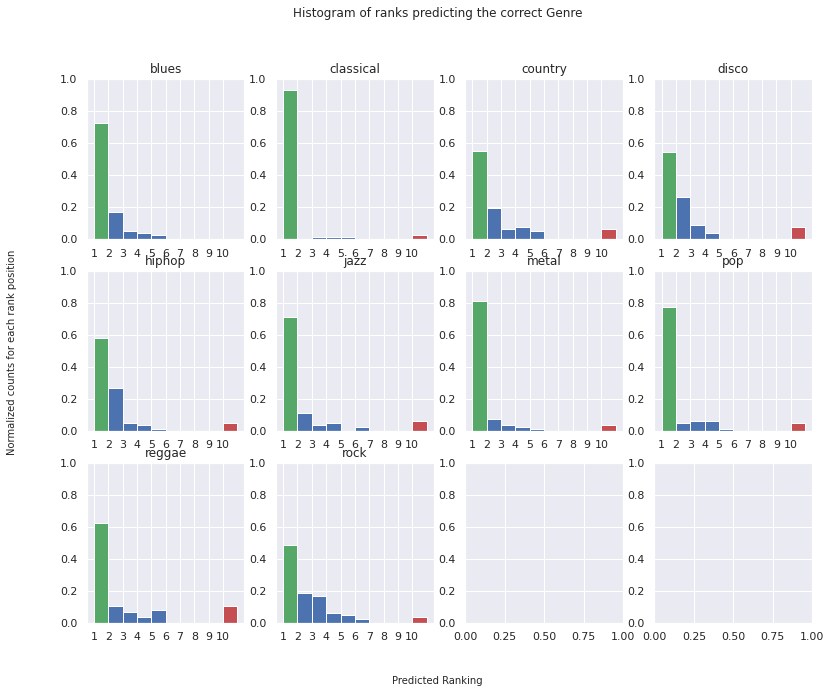

In [14]:
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC

X=data_mapped[params[:-1]]
y=data_mapped['genre']

pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 20)),
                ('clf',SVC(probability = True))])

cross_validate(X,y,pipe,'SVM');

## Logistic regression

Cross validation accuracies:
Overall      0.641250
blues        0.601471
classical    0.905714
country      0.490000
disco        0.602941
hiphop       0.584167
jazz         0.737500
metal        0.809167
pop          0.781618
reggae       0.480000
rock         0.447059
dtype: float64
Overall accuracy on test set is  0.58


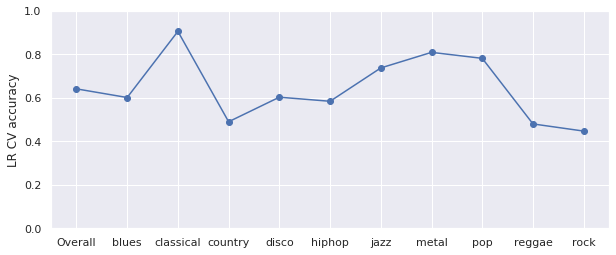

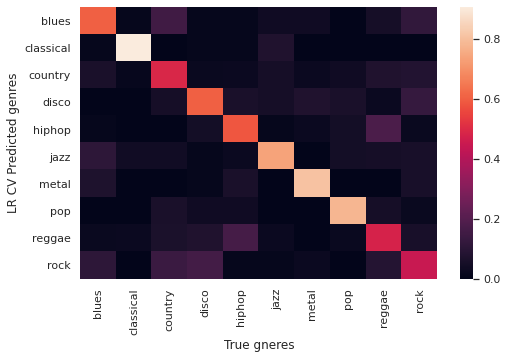

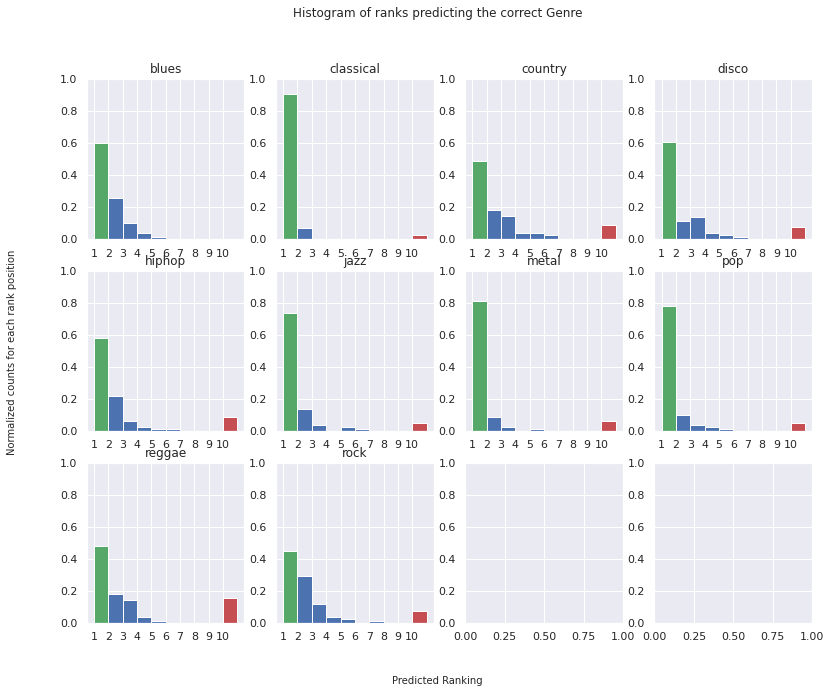

In [16]:
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

X=data_mapped[params[:-1]]
y=data_mapped['genre']

pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 20)),
                ('clf',LogisticRegression(tol=0.05))])

cross_validate(X,y,pipe,'LR');

## Random forest

Cross validation accuracies:
Overall      0.582500
blues        0.662500
classical    0.821905
country      0.500000
disco        0.336029
hiphop       0.532500
jazz         0.675000
metal        0.795000
pop          0.734559
reggae       0.467500
rock         0.329412
dtype: float64
Overall accuracy on test set is  0.555


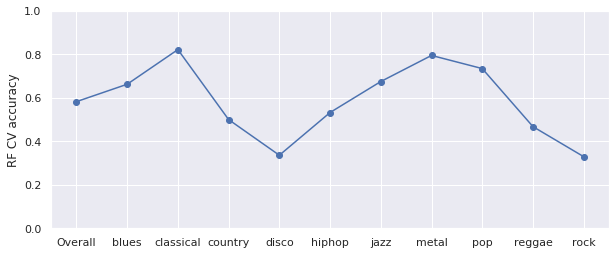

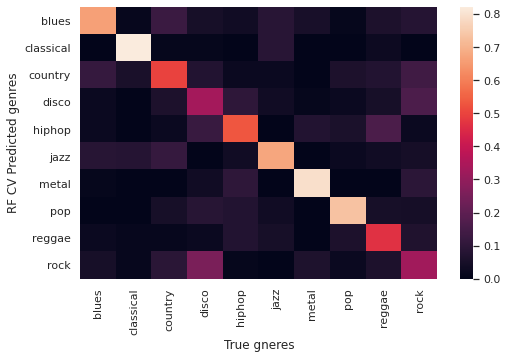

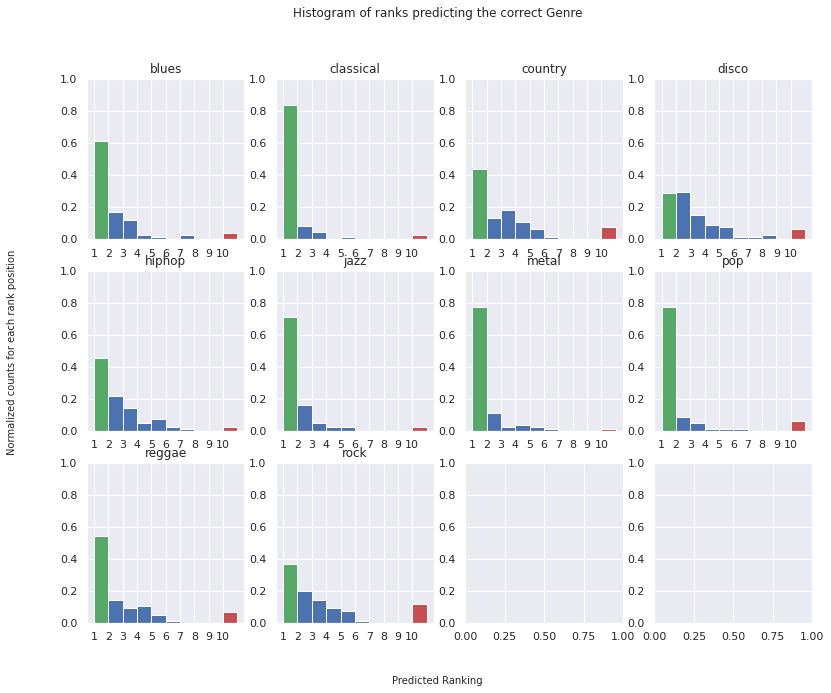

In [17]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

X=data_mapped[params[:-1]]
y=data_mapped['genre']

pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 20)),
                ('clf',RandomForestClassifier(n_estimators=15,max_depth = 1000))])

cross_validate(X,y,pipe,'RF');

## Multilayer perceptron

Cross validation accuracies:
Overall      0.673750
blues        0.722794
classical    0.878095
country      0.593333
disco        0.641176
hiphop       0.609167
jazz         0.775000
metal        0.783333
pop          0.757353
reggae       0.505000
rock         0.494118
dtype: float64
Overall accuracy on test set is  0.635


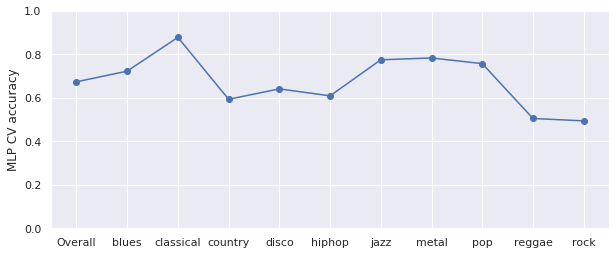

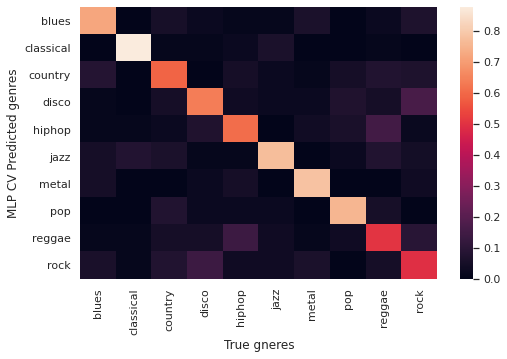

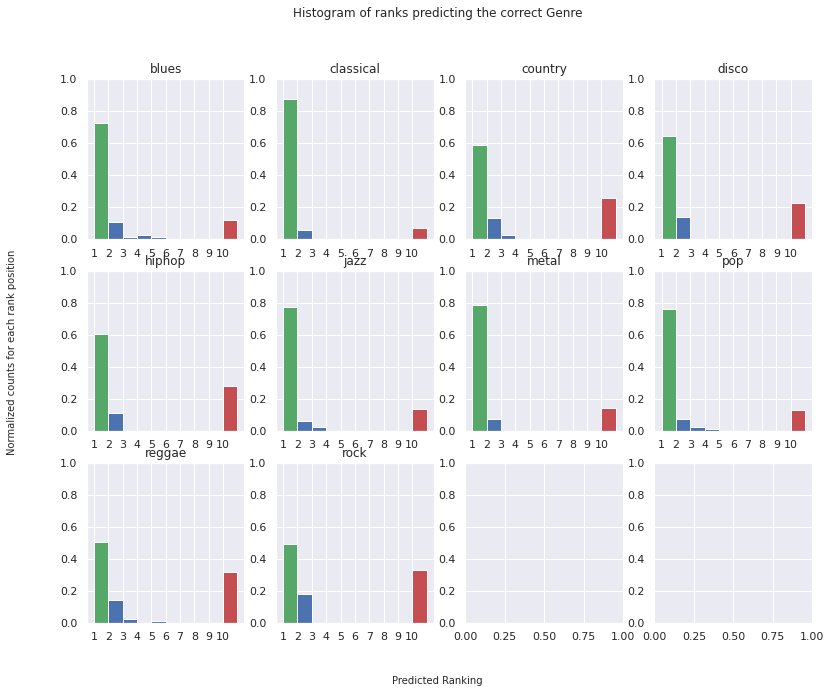

In [20]:
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.neural_network import MLPClassifier

X=data_mapped[params[:-1]]
y=data_mapped['genre']

pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 2)),
                 ('clf',MLPClassifier(hidden_layer_sizes=(100,100),max_iter=1000)),
                ])

cross_validate(X,y,pipe,'MLP');

In [ ]:
# Saving the model to a file

pipe_clone = clone(pipe)
pipe_clone.fit(X,y)

import pickle
with open('MLPC_mfcc20.model','wb') as fh:
    pickle.dump({'model':pipe_clone,
                 'genre_mapper':genre_mapper,
                 'n_mfcc':20,
                 'columns':X.columns},fh)

## Seqential Neural Netwrok from Tensor FLow

In [6]:
from keras import models
from keras import layers
from keras import optimizers
from keras import losses
from keras import metrics
from tensorflow.keras.utils import to_categorical

In [ ]:
from sklearn.model_selection import train_test_split
X=data_mapped[params[:-1]]
y=data_mapped['genre']

def process_X(X):
    from sklearn.preprocessing import StandardScaler as ScalerFx
    scaler = ScalerFx()
    scaler.fit(X)
    return scaler.transform(X);

X_train_train,X_val,y_train_train,y_val = train_test_split(process_X(X), y,
                                                          test_size=.2,
                                                          shuffle=True,
                                                          stratify=y,
                                                          random_state=100)


In [11]:
model = models.Sequential()
model.add(layers.Dense(32, activation='relu', input_shape=(X.shape[1],)))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dense(len(genre_mapper), activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                864       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_2 (Dense)              (None, 10)                330       
Total params: 2,250
Trainable params: 2,250
Non-trainable params: 0
_________________________________________________________________


In [12]:
model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

In [13]:
history = model.fit(X_train_train,
                        to_categorical(y_train_train),
                        epochs = 60,
                        batch_size = 128,
                        validation_data=(X_val,to_categorical(y_val)))
history_dict = history.history

Epoch 1/60
7/7 [==============================] - 13s 83ms/step - loss: 2.3359 - accuracy: 0.1233 - val_loss: 2.1629 - val_accuracy: 0.1750
Epoch 2/60
7/7 [==============================] - 0s 4ms/step - loss: 2.1987 - accuracy: 0.1637 - val_loss: 2.0915 - val_accuracy: 0.2300
Epoch 3/60
7/7 [==============================] - 0s 5ms/step - loss: 2.1398 - accuracy: 0.2238 - val_loss: 2.0316 - val_accuracy: 0.2850
Epoch 4/60
7/7 [==============================] - 0s 4ms/step - loss: 2.0597 - accuracy: 0.2555 - val_loss: 1.9721 - val_accuracy: 0.3450
Epoch 5/60
7/7 [==============================] - 0s 4ms/step - loss: 2.0013 - accuracy: 0.2914 - val_loss: 1.9135 - val_accuracy: 0.3700
Epoch 6/60
7/7 [==============================] - 0s 5ms/step - loss: 1.9412 - accuracy: 0.3120 - val_loss: 1.8573 - val_accuracy: 0.3800
Epoch 7/60
7/7 [==============================] - 0s 5ms/step - loss: 1.8594 - accuracy: 0.3437 - val_loss: 1.8048 - val_accuracy: 0.3800
Epoch 8/60
7/7 [================

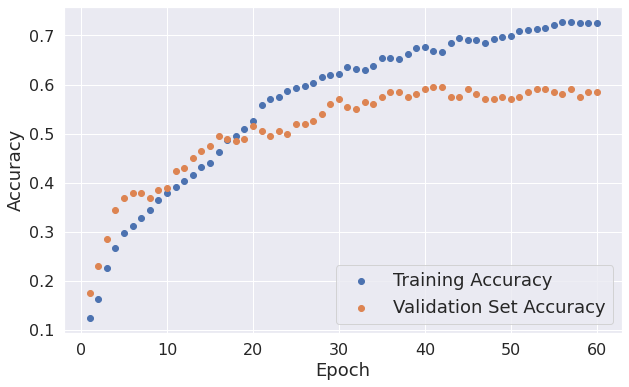

In [15]:

plt.figure(figsize = (10,6))
epcohs=len(history_dict['accuracy'])
plt.scatter(range(1,epcohs+1), history_dict['accuracy'], label = "Training Accuracy")
plt.scatter(range(1,epcohs+1), history_dict['val_accuracy'], label = "Validation Set Accuracy")

plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Accuracy", fontsize=18)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=18)

plt.show()

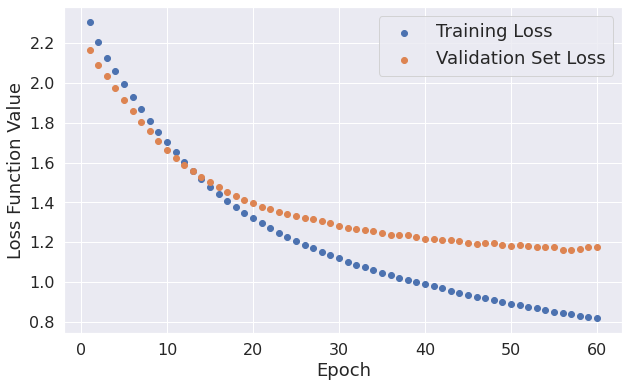

In [16]:
plt.figure(figsize = (10,6))
epcohs=len(history_dict['loss'])
plt.scatter(range(1,epcohs+1), history_dict['loss'], label = "Training Loss")
plt.scatter(range(1,epcohs+1), history_dict['val_loss'], label = "Validation Set Loss")

plt.xlabel("Epoch", fontsize=18)
plt.ylabel("Loss Function Value", fontsize=18)

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.legend(fontsize=18)

plt.show()

In [1]:
pred = np.array([np.argmax(row)  for row in model.predict_proba(X_val)])

from sklearn.metrics import accuracy_score
accs=pd.DataFrame(columns=['Overall']+sorted(list(genre_mapper.keys())))
TrueVsPred=pd.DataFrame(columns=sorted(list(genre_mapper.keys())), index=sorted(list(genre_mapper.keys()))).fillna(0)
tmp_acc={}
tmp_acc['Overall']=accuracy_score(y_val,pred)
tmp_TVP=pd.DataFrame().reindex_like(TrueVsPred)
for k in genre_mapper.keys():
    tmp_index=y_val==genre_mapper[k]
    tmp_acc[k]=accuracy_score(y_val[tmp_index],pred[tmp_index])
    tmp_counts = np.array([list(pred[tmp_index]).count(genre_mapper[k2]) for k2 in genre_mapper.keys()])
    tmp_TVP.loc[genre_mapper.keys(), k] = tmp_counts/tmp_counts.sum()
accs=accs.append(tmp_acc,ignore_index=True)
TrueVsPred=TrueVsPred.add(tmp_TVP)

print(accs.mean())

plt.figure(figsize=(10,4))
plt.plot(accs.mean(),'o-')
plt.ylim([0,1])
plt.ylabel('NN accuracy');

plt.figure(figsize=(8,5))
import seaborn as sns; sns.set()
ax = sns.heatmap(TrueVsPred, cbar=True)
plt.xlabel('True gneres')
plt.ylabel('NN Predicted genres');

NameError: name 'np' is not defined

# Finalzing the model - Ensemble method: Voting calssifier

Since now we have attempted various classifiying models and comapred various metrices, we find KNN, SVM and MLP are best stuited. So, we finalize by building a voting classfier by combining all three models.

Cross validation accuracies:
Overall      0.688750
blues        0.758088
classical    0.891429
country      0.605000
disco        0.616176
hiphop       0.571667
jazz         0.750000
metal        0.809167
pop          0.780882
reggae       0.594167
rock         0.529412
dtype: float64
Overall accuracy on test set is  0.605


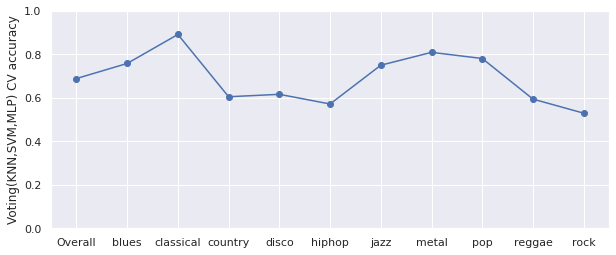

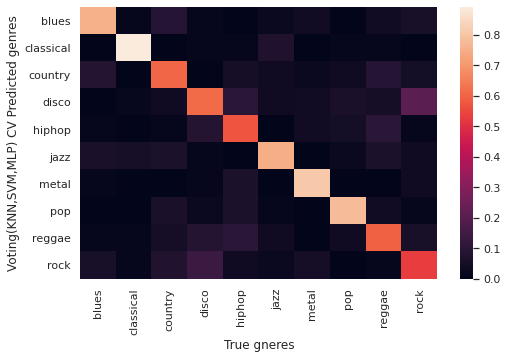

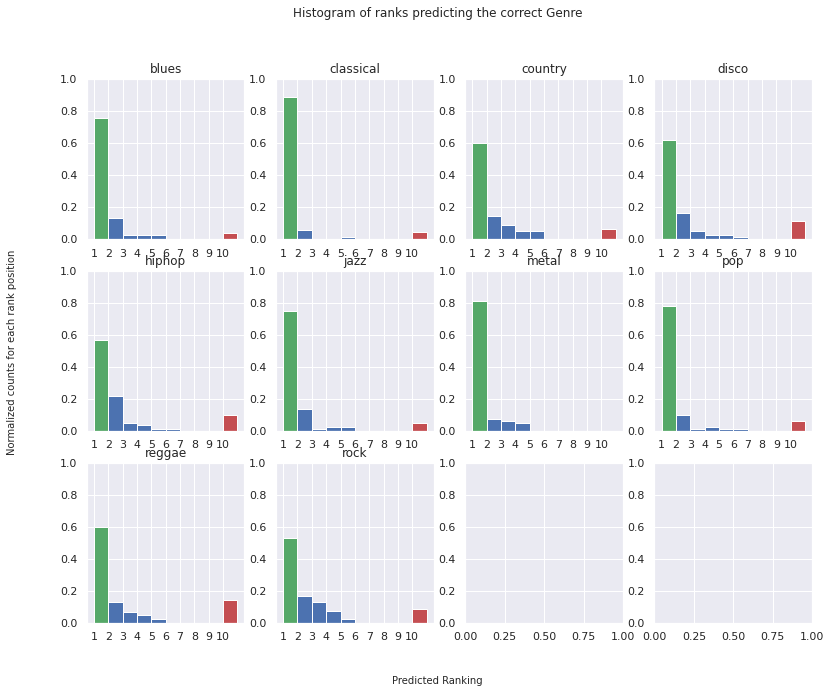

In [21]:
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier

X=data_mapped[params[:-1]]
y=data_mapped['genre']


voting_clf = VotingClassifier(
                [
                ('knn',KNeighborsClassifier(n_neighbors = 7)),
                ('svm',SVC(probability = True)),
                ('mlp',MLPClassifier(hidden_layer_sizes=(100,100),max_iter=1000))],
                voting = "soft")

pipe = Pipeline([('scaler',StandardScaler()),
                 #('pca',PCA(n_components = 20)),
                ('clf',voting_clf)])

cross_validate(X,y,pipe,'Voting(KNN,SVM,MLP)');

In [ ]:
# Saving the model to a file

pipe_clone = clone(pipe)
pipe_clone.fit(X,y)

import pickle
with open('VoteC_mfcc20.model','wb') as fh:
    pickle.dump({'model':pipe_clone,
                 'genre_mapper':genre_mapper,
                 'n_mfcc':20,
                 'columns':X.columns},fh)